In [ ]:
!pip install geopandas

In [ ]:
from google.colab import files
uploaded = files.upload()
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import folium
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import os
os.chdir("/content")
import Final_project as f

In [ ]:
df_ori = pd.read_csv('NYPD_Shooting_Incident_Data__Historic_.csv')
df=f.clean_dataset(df_ori)
df.head(5)

,OCCUR_DATE,OCCUR_TIME,BORO,STATISTICAL_MURDER_FLAG,PERP_AGE_GROUP,PERP_SEX,PERP_RACE,VIC_AGE_GROUP,VIC_SEX,VIC_RACE,Latitude,Longitude,month,year,weekday
0,2019-08-23,Evening,QUEENS,False,NaN,NaN,NaN,25-44,M,BLACK,40.697805,-73.808141,8,2019,Friday
1,2019-11-27,Afternoon,BRONX,False,<18,M,BLACK,25-44,F,BLACK,40.818700,-73.918571,11,2019,Wednesday
2,2019-02-02,Evening,MANHATTAN,False,18-24,M,WHITE HISPANIC,18-24,M,BLACK HISPANIC,40.791916,-73.945480,2,2019,Saturday
3,2019-10-24,Night,STATEN ISLAND,True,25-44,M,BLACK,25-44,F,BLACK,40.638064,-74.166108,10,2019,Thursday
4,2019-08-22,Afternoon,BRONX,False,25-44,M,BLACK HISPANIC,18-24,M,BLACK,40.854547,-73.913339,8,2019,Thursday


In [ ]:
latitude = 40.71
longitude = -74.00

In [ ]:

# get the first 200 crimes in the cdata
limit = 2000
data = df.iloc[0:limit, :]

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# Loop through the 200 crimes and add each to the incidents feature group
for lat, lng, in zip(data.Latitude, data.Longitude):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=7, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='red',
            fill_opacity=0.4
        )
    )

# Add incidents to map
san_map = folium.Map(location=[40.71, -74.00], zoom_start=12)
san_map.add_child(incidents)

In [ ]:


from folium import plugins

# let's start again with a clean copy of the map of San Francisco
san_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(san_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(data.Latitude, data.Longitude, data.VIC_AGE_GROUP):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# add incidents to map
san_map.add_child(incidents)

In [ ]:
disdata = pd.DataFrame(df['BORO'].value_counts())
disdata.reset_index(inplace=True)
disdata.rename(columns={'index':'Neighborhood','BORO':'Count'},inplace=True)

disdata['Neighborhood'] = disdata['Neighborhood'].str.capitalize()
disdata.iloc[4,0] = 'Staten Island'


In [ ]:

city = gpd.read_file('Borough Boundaries.geojson')

m = folium.Map(location=[40.71,-74.00], zoom_start=11)
folium.Choropleth(
    geo_data=city,
    data=disdata,
    columns=['Neighborhood','Count'],
    key_on='feature.properties.boro_name',
    fill_color='PuRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    highlight=True,
    legend_name='Crime Counts in New York City'
).add_to(m)
m



In [ ]:
from folium.plugins import HeatMap

# let's start again with a clean copy of the map of San Francisco
san_map = folium.Map(location = [latitude, longitude], zoom_start = 11)

# Convert data format
heatdata = data[['Latitude','Longitude']].values.tolist()

# add incidents to map
HeatMap(heatdata).add_to(san_map)

san_map



In [ ]:
m = df[['PERP_AGE_GROUP','PERP_SEX']]
m = m.query('PERP_SEX== "M"')

m = m['PERP_AGE_GROUP'].value_counts().to_frame()
m

In [ ]:
fm = df[['PERP_AGE_GROUP','PERP_SEX']]
fm = fm.query('PERP_SEX== "F"')

fm = fm['PERP_AGE_GROUP'].value_counts().to_frame()
fm

In [ ]:
from PIL import Image
im = Image.open('nyc.jpg')


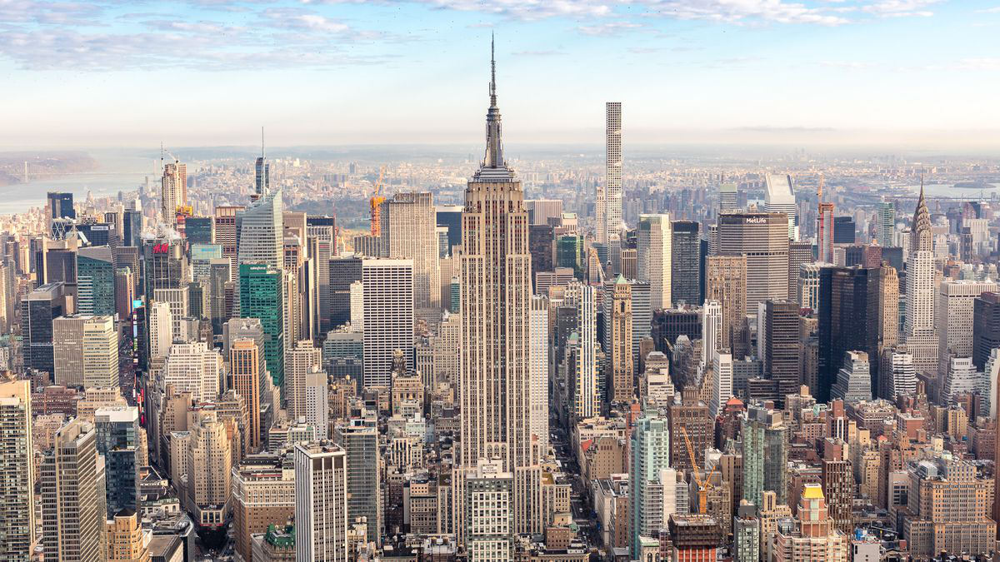

In [ ]:
trace0 = go.Bar(
    
    y=["<18", "18-24", "25-44", "45+"],  
    x=[1298,5248,4357,497],
    name="Male",
    marker={
        "color": "green",
    },
    
    orientation="h"
)
trace1 = go.Bar(
    
    y=["<18", "18-24", "25-44", "45+"],  
    x=[34,124,136,18],
    name="Female",
    marker={
        "color": "pink",
    },
    
    orientation="h"
)
fig = go.Figure(data=[trace0, trace1],   layout={
                   "images": [
                       {"source": im,  
                        "sizex": 1, 
                        "sizey": 1, 
                        "yanchor": "bottom", 
                        "opacity": 0.3,  
                        }
                   ],
                 
                   "width": im.width - 120,
                   "height": im.height,
                })
fig

In [ ]:
a = df[['VIC_AGE_GROUP','VIC_SEX']]
a = a.query('VIC_SEX== "M"')

a = a['VIC_AGE_GROUP'].value_counts().to_frame()
a


In [ ]:
b = df[['VIC_AGE_GROUP','VIC_SEX']]
b = b.query('VIC_SEX== "F"')

b = b['VIC_AGE_GROUP'].value_counts().to_frame()
b

In [ ]:
from PIL import Image
im1 = Image.open('nyc1.jpg')


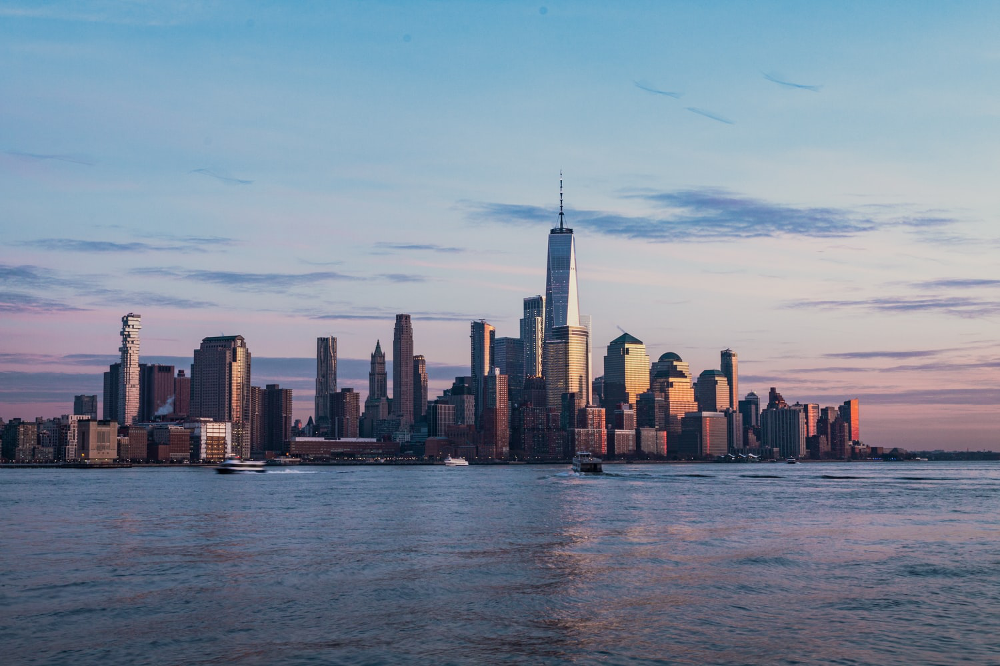

In [ ]:
trace0 = go.Bar(
    
    y=["<18", "18-24", "25-44", "45+"],  
    x=[1774,6994,8262,1181],
    name="Male",
    marker={
        "color": "green",
    },
    
    orientation="h"
)
trace1 = go.Bar(
    
    y=["<18", "18-24", "25-44", "45+"],  
    x=[319,568,725,322],
    name="Female",
    marker={
        "color": "pink",
    },
    
    orientation="h"
)
fig = go.Figure(data=[trace0, trace1],   layout={
                   "images": [
                       {"source": im,  
                        "sizex": 1, 
                        "sizey": 1, 
                        "yanchor": "bottom", 
                        "opacity": 0.3,  
                        }
                   ],
                 
                   "width": im.width - 60,
                   "height": im.height,
                })
fig